In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
import numpy as np
import pandas as pd
from pathlib import Path
import openslide
import matplotlib.pyplot as plt
import cv2
import imutils
from enum import Enum
from probreg import transformation as tf

In [3]:
from probreg import cpd
from probreg import callbacks
import open3d as o3

## Background
- https://www.learnopencv.com/homography-examples-using-opencv-python-c/
- http://www.cs.columbia.edu/~allen/F17/NOTES/homography_pka.pdf

In [4]:
class RegMethod(Enum):
    Homography = 0,
    Affine = 1,
        
    
def align_images(source_image, target_image, maxFeatures:int=500, 
                 keepPercent:float=0.2, debug=False, 
                 source_scale:tuple=(1,1), target_scale:tuple=(1,1)):

    source_scale = np.array(source_scale)
    target_scale = np.array(target_scale)
    
    # convert both the input image and template to grayscale
    imageGray = cv2.cvtColor(source_image, cv2.COLOR_BGR2GRAY)
    templateGray = cv2.cvtColor(target_image, cv2.COLOR_BGR2GRAY)
    
    # use ORB to detect keypoints and extract (binary) local
    # invariant features
    orb = cv2.ORB_create(maxFeatures)
    (kpsA, descsA) = orb.detectAndCompute(imageGray, None)
    (kpsB, descsB) = orb.detectAndCompute(templateGray, None)
    # match the features
    method = cv2.DESCRIPTOR_MATCHER_BRUTEFORCE_HAMMING
    matcher = cv2.DescriptorMatcher_create(method)
    matches = matcher.match(descsA, descsB, None)
    
    
    # sort the matches by their distance (the smaller the distance,
    # the "more similar" the features are)
    matches = sorted(matches, key=lambda x:x.distance)
    # keep only the top matches
    keep = int(len(matches) * keepPercent)
    matches = matches[:keep]
    # check to see if we should visualize the matched keypoints
    if debug:
        matchedVis = cv2.drawMatches(source_image, kpsA, target_image, kpsB,matches, None)
        matchedVis = imutils.resize(matchedVis, width=1000)
        
        fig, ax = plt.subplots(figsize=(16, 16))
        ax.imshow(matchedVis)
        plt.tight_layout()
        
        
    # allocate memory for the keypoints (x, y)-coordinates from the
    # top matches -- we'll use these coordinates to compute our
    # homography matrix
    ptsA = np.zeros((len(matches), 2), dtype="float")
    ptsB = np.zeros((len(matches), 2), dtype="float")
    # loop over the top matches
    for (i, m) in enumerate(matches):
        # indicate that the two keypoints in the respective images
        # map to each other
        ptsA[i] = kpsA[m.queryIdx].pt * source_scale 
        ptsB[i] = kpsB[m.trainIdx].pt * target_scale
        
    # compute the homography matrix between the two sets of matched
    # points
    (H, mask) = cv2.findHomography(ptsA, ptsB, method=cv2.RANSAC)

    return H, ptsA, ptsB

In [5]:
file_scanner = {
    "24_EIPH_576255 Berliner Blau.svs": {"Name": "Aperio", "slide": None, "thumbnail": None},
    "Z_BB_576255_1.tif": {"Name":"AxioScan", "slide": None, "thumbnail": None},
    "N2_BB_576255_1.ndpi": {"Name": "NanoZoomer2.0HT", "slide": None, "thumbnail": None},
    "N1_BB_576255_1.ndpi": {"Name": "NanoZoomerS210", "slide": None, "thumbnail": None},
}

In [6]:
df = pd.read_pickle("reg_results.p")

df["center_x"] = [x1 + ((x2-x1) / 2) for x1, x2 in zip(df["x1"], df["x2"])]
df["center_y"] = [y1 + ((y2-y1) / 2) for y1, y2 in zip(df["y1"], df["y2"])]

df["scanner"] = [file_scanner[file]["Name"] for file in df["file"]]

df.head()

,file,scanner,image_nr,width,height,x1,y1,x2,y2,label,score,center_x,center_y
0,24_EIPH_576255 Berliner Blau.svs,Aperio,576255,34200,32356,10978.0,7036.0,11107.0,7166.0,4.0,0.929032,11042.5,7101.0
1,24_EIPH_576255 Berliner Blau.svs,Aperio,576255,34200,32356,30033.0,13813.0,30201.0,13981.0,2.0,0.926395,30117.0,13897.0
2,24_EIPH_576255 Berliner Blau.svs,Aperio,576255,34200,32356,18278.0,4283.0,18394.0,4399.0,1.0,0.926342,18336.0,4341.0
3,24_EIPH_576255 Berliner Blau.svs,Aperio,576255,34200,32356,25220.0,11058.0,25328.0,11167.0,1.0,0.925790,25274.0,11112.5
4,24_EIPH_576255 Berliner Blau.svs,Aperio,576255,34200,32356,12767.0,22738.0,12885.0,22856.0,1.0,0.922600,12826.0,22797.0


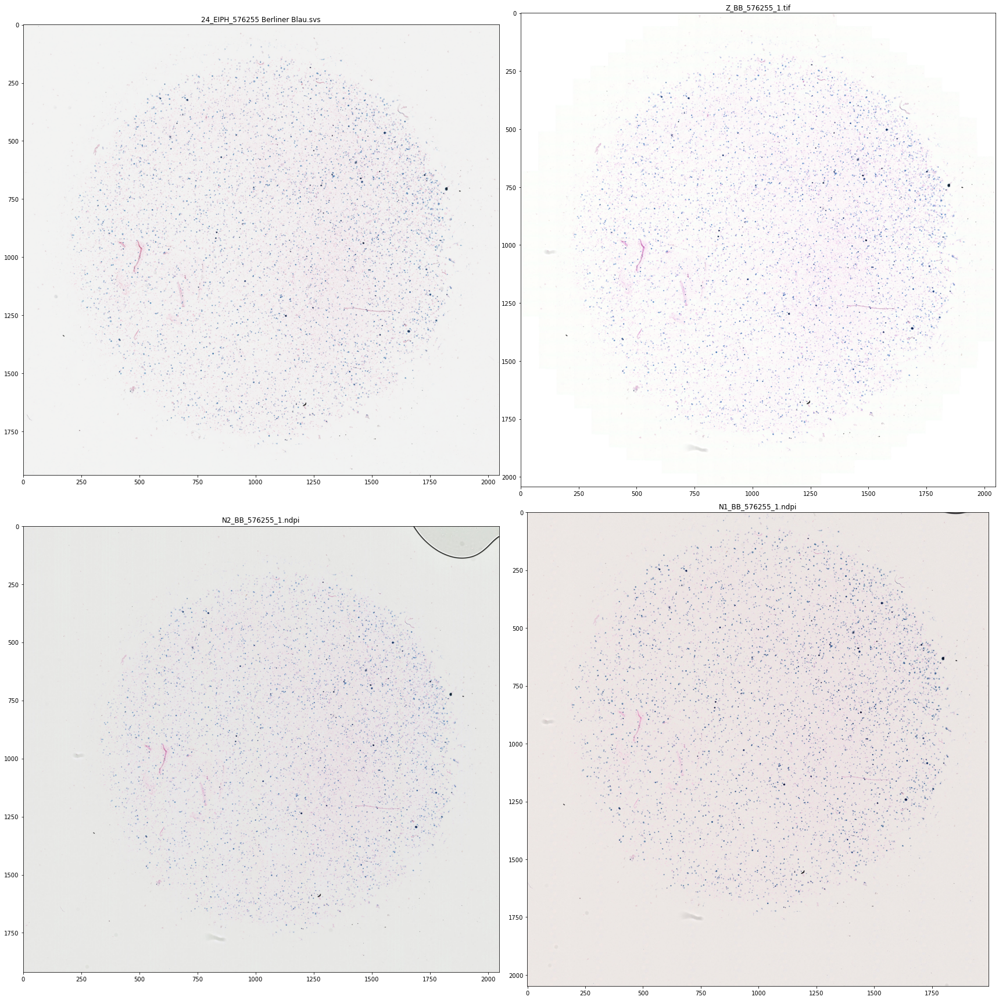

In [7]:
f, axarr = plt.subplots(2,2,figsize=(24,24))

for id, path in enumerate(df["file"].unique()):
    
    slide = openslide.OpenSlide(filename=f'../Slides/{file_scanner[path]["Name"]}/{path}')
    file_scanner[path]["slide"] = slide
    
    thumbnail = slide.get_thumbnail(size=(2048, 2048))
    height, width = thumbnail.height, thumbnail.width
    
    scale_y, scale_x = np.array(slide.dimensions) / np.array([thumbnail.height, thumbnail.width])
    file_scanner[path]["scale"] = np.array([scale_x, scale_y])

    file_scanner[path]["thumbnail"] = thumbnail
        
    if id == 0: axarr[0,0].imshow(thumbnail); axarr[0,0].set_title(path)
    if id == 1: axarr[0,1].imshow(thumbnail); axarr[0,1].set_title(path)
    if id == 2: axarr[1,0].imshow(thumbnail); axarr[1,0].set_title(path)
    if id == 3: axarr[1,1].imshow(thumbnail); axarr[1,1].set_title(path)    
        
plt.tight_layout()

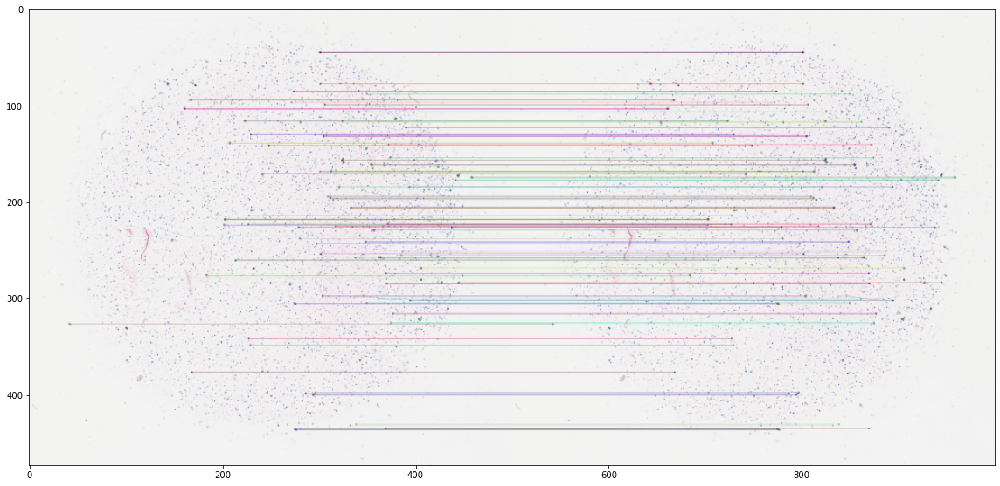

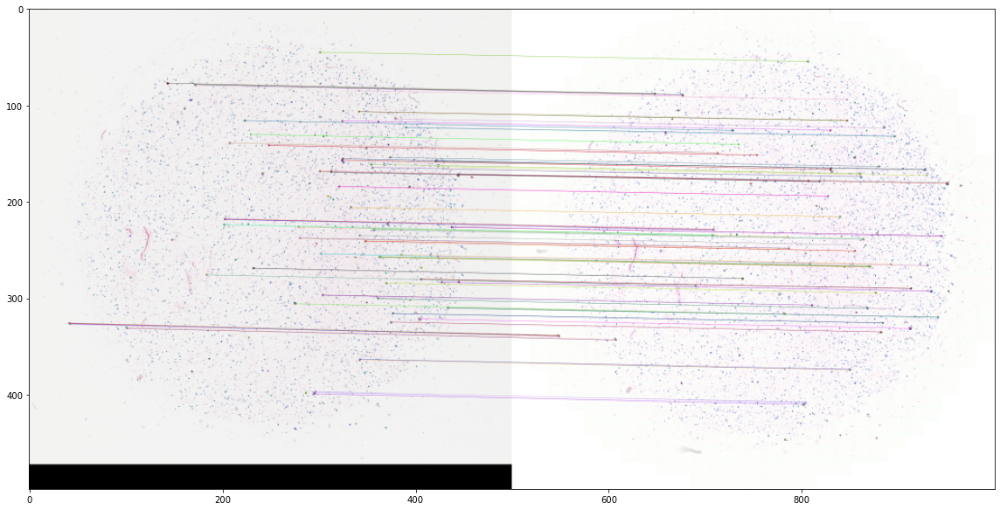

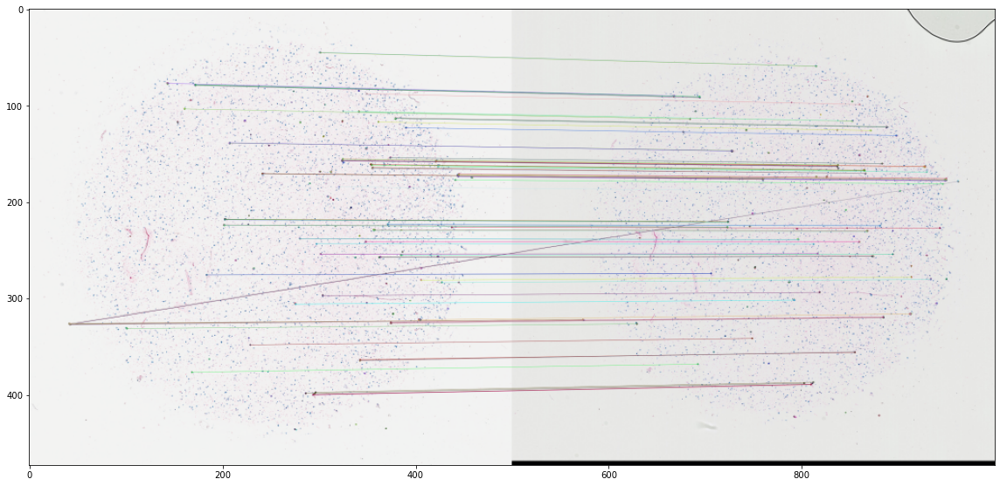

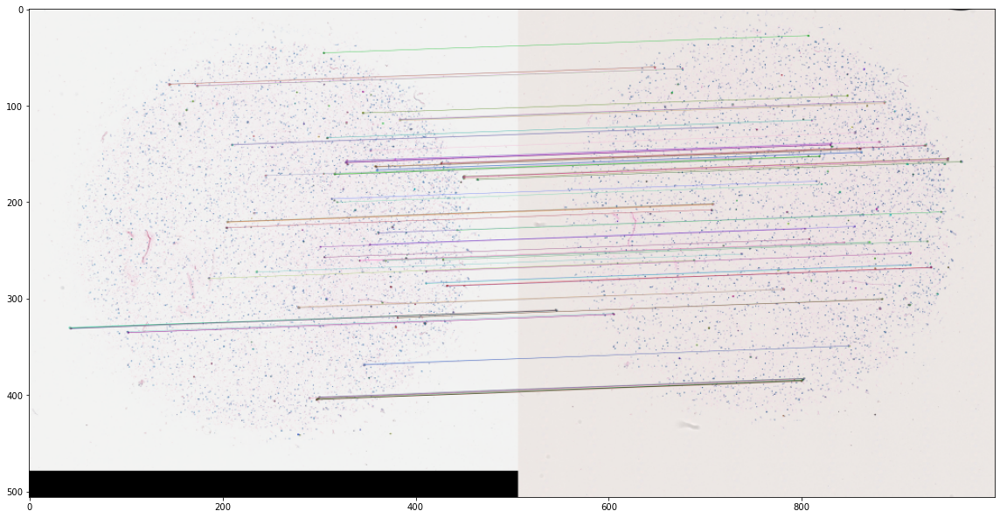

In [8]:
source_file = "24_EIPH_576255 Berliner Blau.svs"
source_image = np.array(file_scanner[source_file]["thumbnail"])
source_scale = file_scanner[source_file]["scale"]

for path in df["file"].unique():
    target_image = np.array(file_scanner[path]["thumbnail"])
    target_scale = file_scanner[path]["scale"]
    
    H, ptsA, ptsB = align_images(source_image, target_image, debug=True)

    tf_param, _, _ = cpd.registration_cpd(ptsA, ptsB, 'affine')
    
    
    transformed = tf_param.transform(ptsB)
    offset = np.mean(abs(1 - transformed / ptsB))
    
    file_scanner[path]["Homography"] = H
    file_scanner[path]["ptsA"] = ptsA
    file_scanner[path]["ptsB"] = ptsB
    file_scanner[path]["tf_b"] = tf_param.b
    file_scanner[path]["tf_t"] = tf_param.t
    file_scanner[path]["offset"] = offset

In [9]:
source_file = "24_EIPH_576255 Berliner Blau.svs"
source_slide = file_scanner[source_file]["slide"]

## Homography Transform

### Thumbnail

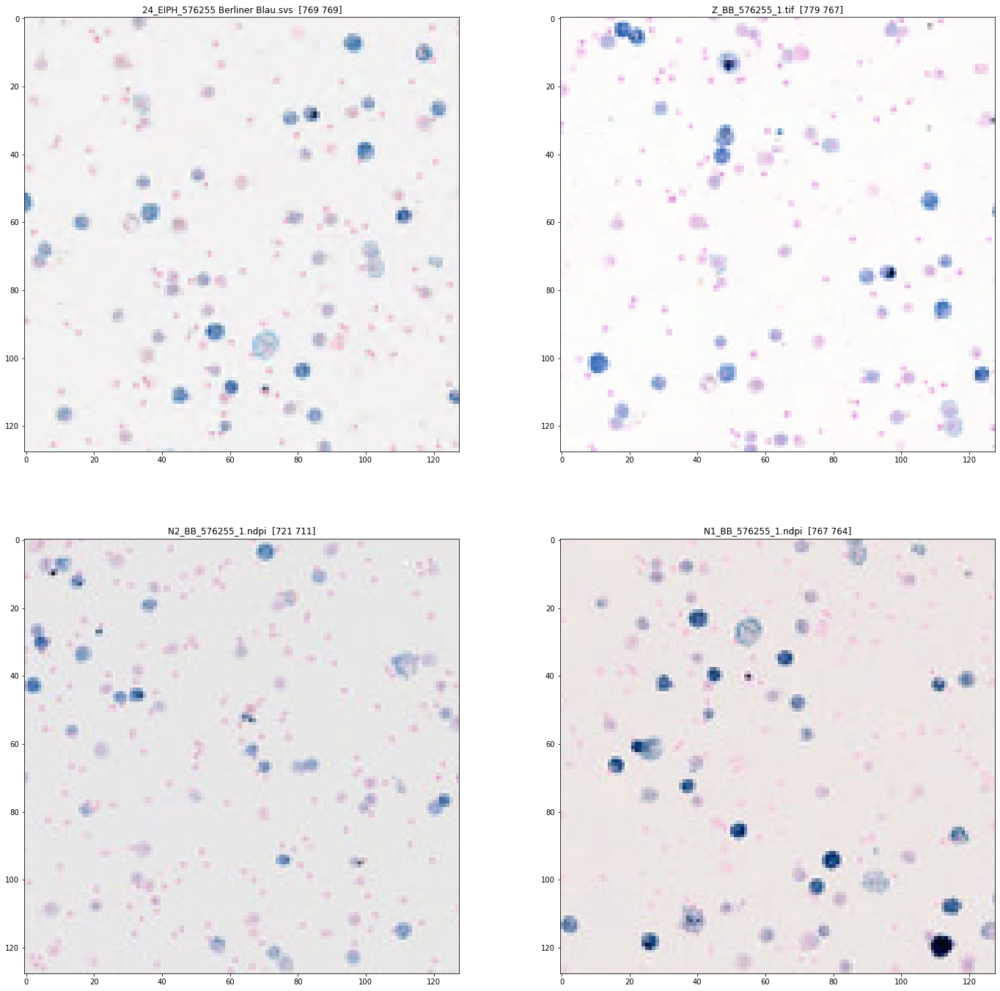

In [10]:
f, axarr = plt.subplots(2,2, figsize=(24,24))

size = 64
x_source_thumbnail, y_source_thumbnail = 768, 768

for id, path in enumerate(df["file"].unique()):
    
    H = file_scanner[path]["Homography"]    
    tf_temp = tf.AffineTransformation(H[:2,:2], H[2:,2:])
    
    transformed = tf_temp.transform(np.array([x_source_thumbnail, y_source_thumbnail])).astype(int)[0]
    
    y_min_a, x_min_a = np.flip(transformed)
    
    thumbnail = np.array(file_scanner[path]["thumbnail"])  
    
    image_target = thumbnail[y_min_a-size:y_min_a+size, x_min_a-size:x_min_a+size]    

    if id == 0: axarr[0,0].imshow(image_target); axarr[0,0].set_title(f'{path}  {transformed}')
    if id == 1: axarr[0,1].imshow(image_target); axarr[0,1].set_title(f'{path}  {transformed}')
    if id == 2: axarr[1,0].imshow(image_target); axarr[1,0].set_title(f'{path}  {transformed}')
    if id == 3: axarr[1,1].imshow(image_target); axarr[1,1].set_title(f'{path}  {transformed}')

## ICP

### Thumbnail

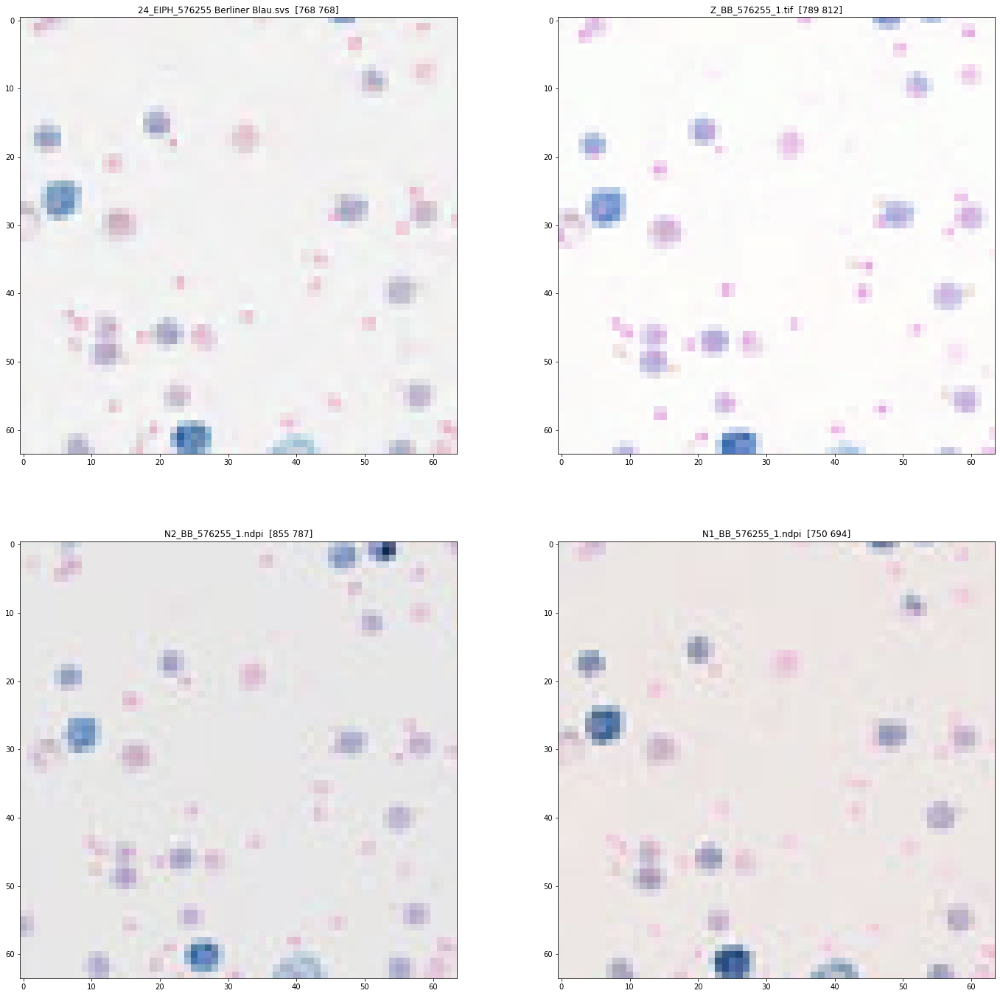

In [11]:
f, axarr = plt.subplots(2,2,figsize=(24,24))

size = 32
x_source_thumbnail, y_source_thumbnail = 768, 768

for id, path in enumerate(df["file"].unique()):
    
    tf_b = file_scanner[path]["tf_b"]    
    tf_t = file_scanner[path]["tf_t"]    
    tf_temp = tf.AffineTransformation(tf_b, tf_t)
    
    transformed = tf_temp.transform(np.array([x_source_thumbnail, y_source_thumbnail])).astype(int)
    
    y_min_a, x_min_a = np.flip(transformed)
    
    thumbnail = np.array(file_scanner[path]["thumbnail"])  
    
    image_target = thumbnail[y_min_a-size:y_min_a+size, x_min_a-size:x_min_a+size]    

    if id == 0: axarr[0,0].imshow(image_target); axarr[0,0].set_title(f'{path}  {transformed}')
    if id == 1: axarr[0,1].imshow(image_target); axarr[0,1].set_title(f'{path}  {transformed}')
    if id == 2: axarr[1,0].imshow(image_target); axarr[1,0].set_title(f'{path}  {transformed}')
    if id == 3: axarr[1,1].imshow(image_target); axarr[1,1].set_title(f'{path}  {transformed}')

## Feature Points Thumbnail

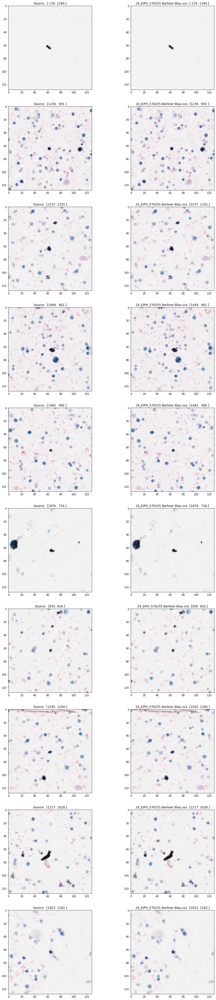

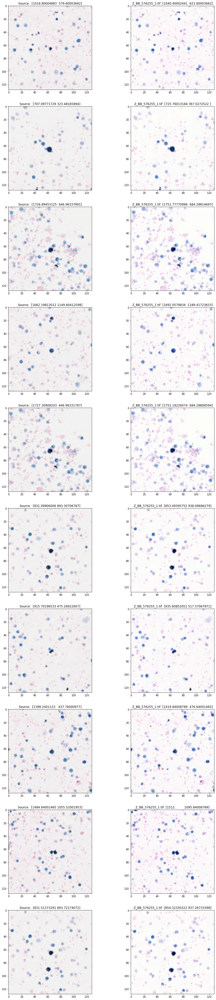

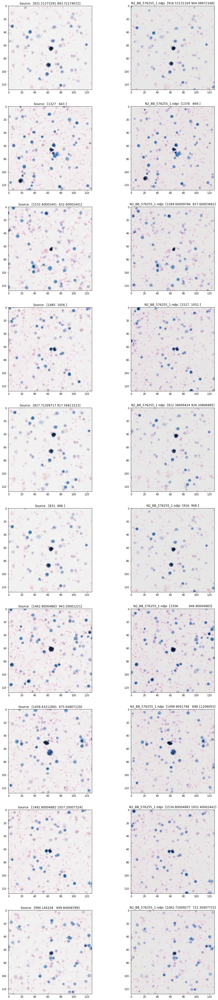

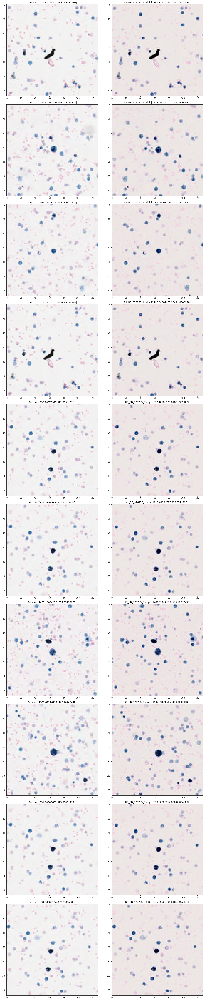

In [12]:
num_patches = 10
size = 64

source_thumbnail = np.array(file_scanner[source_file]["thumbnail"])

for id, path in enumerate(df["file"].unique()):
    
    f, axarr = plt.subplots(num_patches, 2, figsize=(16, 72))
    
    
    target_thumbnail = np.array(file_scanner[path]["thumbnail"])    
    
    ptsA = file_scanner[path]["ptsA"]
    ptsB = file_scanner[path]["ptsB"]
    
    for idx, (pA, pB) in enumerate(zip(ptsA, ptsB)):    
    
        y_min_a, x_min_a = np.flip(pA).astype(int) # reverse for numpy 
        y_min_b, x_min_b = np.flip(pB).astype(int) # reverse for numpy 
    
        image_source = source_thumbnail[y_min_a-size:y_min_a+size, x_min_a-size:x_min_a+size]
        image_target = target_thumbnail[y_min_b-size:y_min_b+size, x_min_b-size:x_min_b+size]
    
        axarr[idx,0].set_title(f'Source:  {pA}')
        axarr[idx,1].set_title(f'{path}  {pB}')
        axarr[idx,0].imshow(image_source)
        axarr[idx,1].imshow(image_target)
        
        if num_patches-1 == idx:
            break

plt.tight_layout()    

## Error

In [28]:
off_dict = {}

for id, path in enumerate(df["file"].unique()):
    
    tf_b = file_scanner[path]["tf_b"]    
    tf_t = file_scanner[path]["tf_t"]    
    tf_temp = tf.AffineTransformation(tf_b, tf_t)
        
    ptsA = file_scanner[path]["ptsA"]
    ptsB = file_scanner[path]["ptsB"]
    
    transformed = tf_temp.transform(ptsB)
    
    print(np.mean(abs(1 - transformed / ptsB))) #[:10]
    
    off_dict[path] = {"ptsB": ptsB, "newB": transformed}

1.1435297153639113e-16
0.039684573106513
0.0528546802007871
0.06521699075063929


In [26]:
np.mean(abs(1 - transformed[:10] / ptsB[:10]))

0.054568969245628075

In [15]:
ptsB[:10]

array([[ 176., 1340.],
       [1236.,  691.],
       [1537., 1335.],
       [1449.,  661.],
       [1482.,  480.],
       [1876.,  716.],
       [ 930.,  916.],
       [1545., 1294.],
       [1217., 1628.],
       [1822., 1162.]])

In [18]:
np.mean(transformed[:10] / ptsB[:10])

1.0

In [31]:
slide.dimensions

(38400, 39424)

In [32]:
help(slide.get_thumbnail)

Help on method get_thumbnail in module openslide:

get_thumbnail(size) method of openslide.OpenSlide instance
    Return a PIL.Image containing an RGB thumbnail of the image.
    
    size:     the maximum size of the thumbnail.



In [34]:
help(slide.get_best_level_for_downsample)

Help on method get_best_level_for_downsample in module openslide:

get_best_level_for_downsample(downsample) method of openslide.OpenSlide instance
    Return the best level for displaying the given downsample.



In [43]:
from PIL import Image
def get_pil(tile):
    thumb = Image.new('RGB', tile.size, '#ffffff')
    thumb.paste(tile, None, tile)
    #thumb.thumbnail(size, Image.ANTIALIAS)
    return thumb

In [49]:
slide.level_dimensions

((38400, 39424),
 (19200, 19712),
 (9600, 9856),
 (4800, 4928),
 (2400, 2464),
 (1200, 1232),
 (600, 616),
 (300, 308),
 (150, 154),
 (75, 77))

In [70]:
slide.level_dimensions[3]

(4800, 4928)

In [66]:
start_dim = 2048
multi = 4

dim = multi * start_dim

downsample = max(*[dim / thumb for dim, thumb in zip(slide.dimensions, (dim, dim))])
downsample

4.8125

In [67]:
level = slide.get_best_level_for_downsample(downsample)
level

2

In [69]:
slide.level_downsamples[level]

4.0

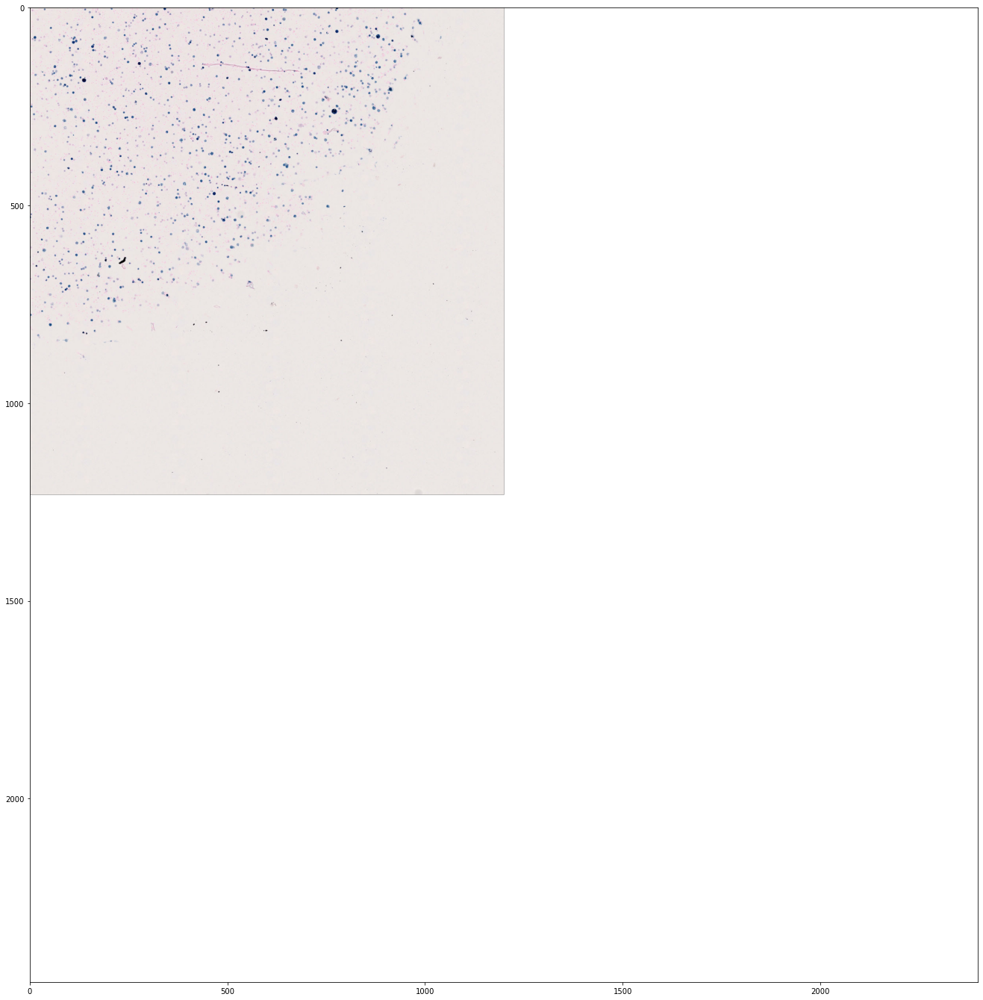

In [76]:
tile = slide.read_region((38400 // 2, 39424 // 2), 4, (4800 // 2, 4928 // 2))

fig, ax = plt.subplots(figsize=(24,24))
plt.imshow(tile)